In [42]:
import pandas as pd
import cv2 as cv
import matplotlib.pyplot as plt

df = pd.read_csv('styles.csv')
image_path = 'e-commerce/images/'
df.shape

(44441, 10)

In [3]:
# utility functions for accessing images

def plot_figures(figures, nrows = 1, ncols=1, figsize=(16, 16)):
    fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize)
    for i,title in enumerate(figures):
        ax.ravel()[i].imshow(cv.cvtColor(figures[title], cv.COLOR_BGR2RGB))
        ax.ravel()[i].set_title(title)
        ax.ravel()[i].set_axis_off()
    plt.tight_layout()
    
def img_path(idx):
    return image_path + str(idx) + '.jpg'

def load_image(idx, resized_fac = 0.1):
    img = cv.imread(img_path(idx))
    img = cv.resize(img, (224, 224))
    return img

In [43]:
# iterate through master categories to see which are worth keeping
for C in df.masterCategory.unique():
    figures = {f'CATEGORY {C} ' + f'image {i}' + '\n' : load_image(row['id']) for i, row in df[df.masterCategory == C].sample(5, replace=1).iterrows()}
    plot_figures(figures, 1, 5)

Error in callback <function flush_figures at 0x000001A96C9F4CA0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [44]:
# only Apparel and Footwear will be relevant to us
df = df[(df.masterCategory == 'Apparel') | (df.masterCategory == 'Footwear')]
df.shape

(30617, 10)

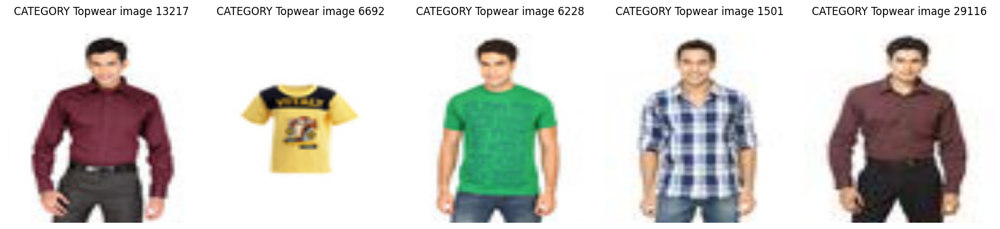

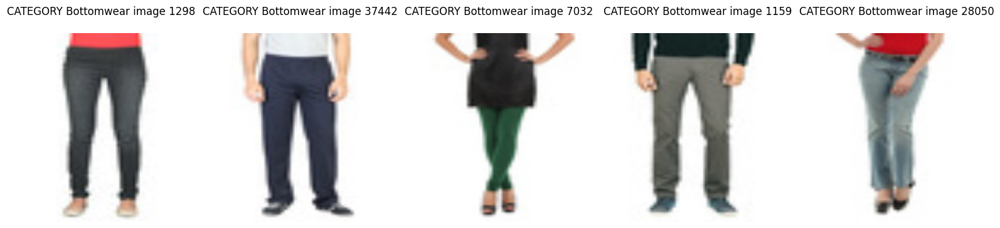

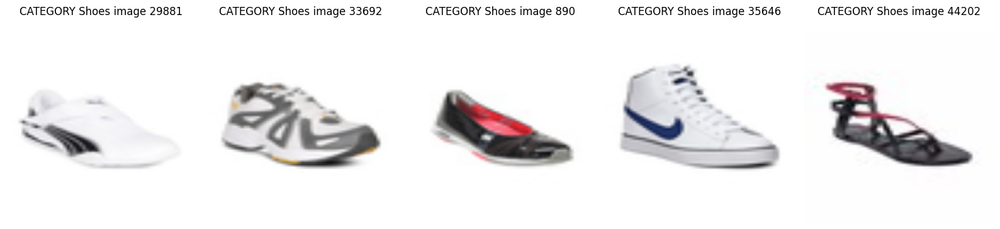

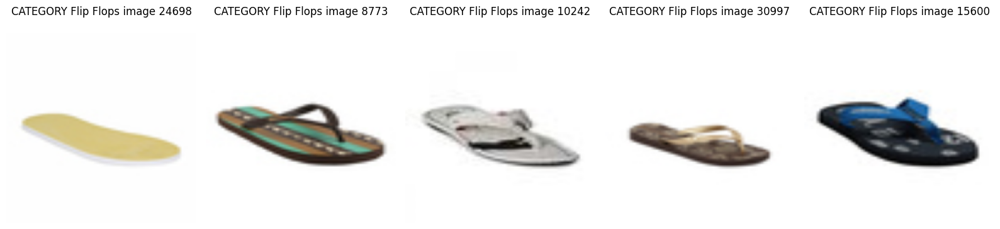

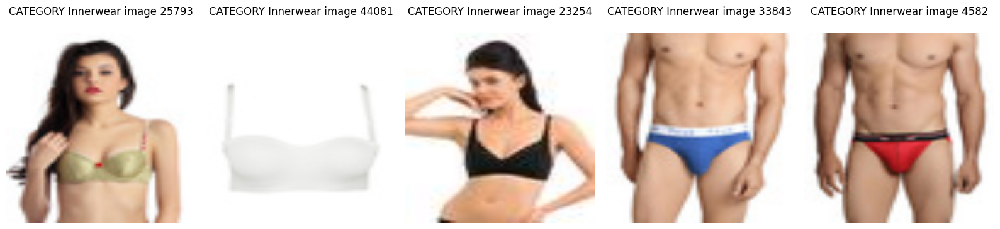

...

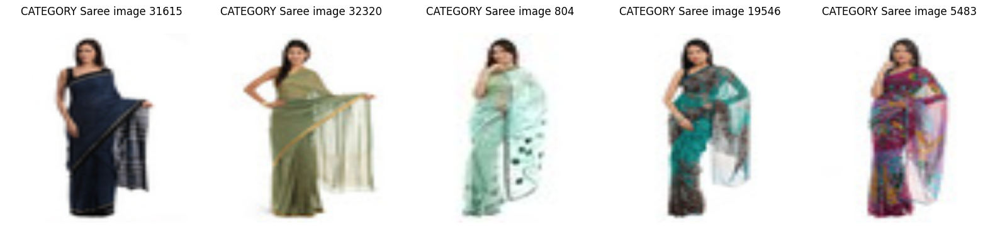

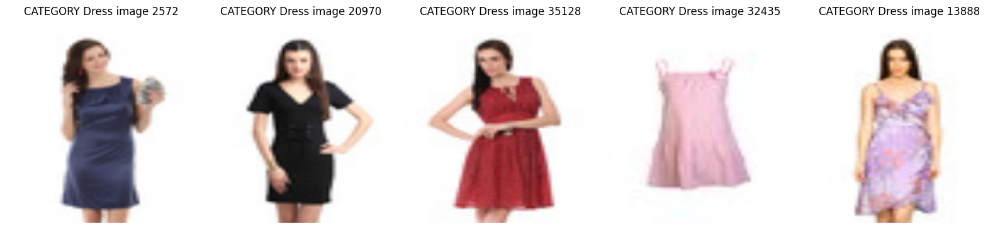

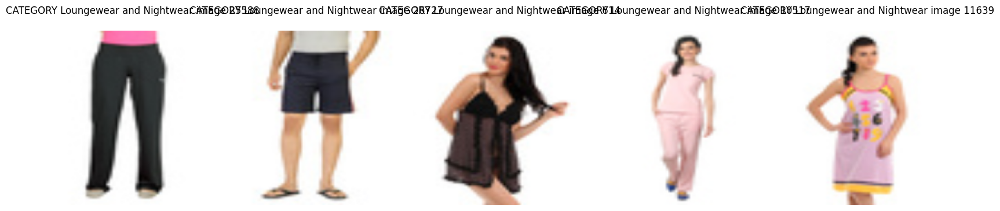

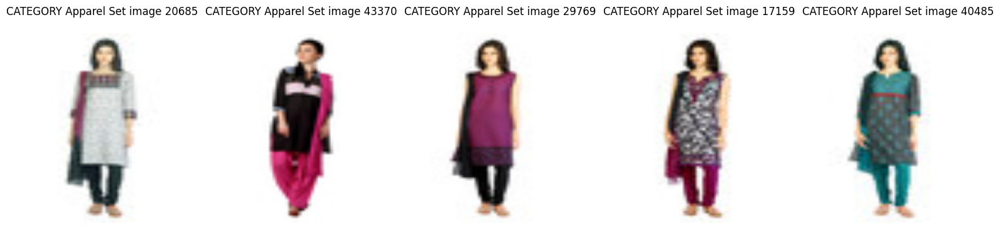

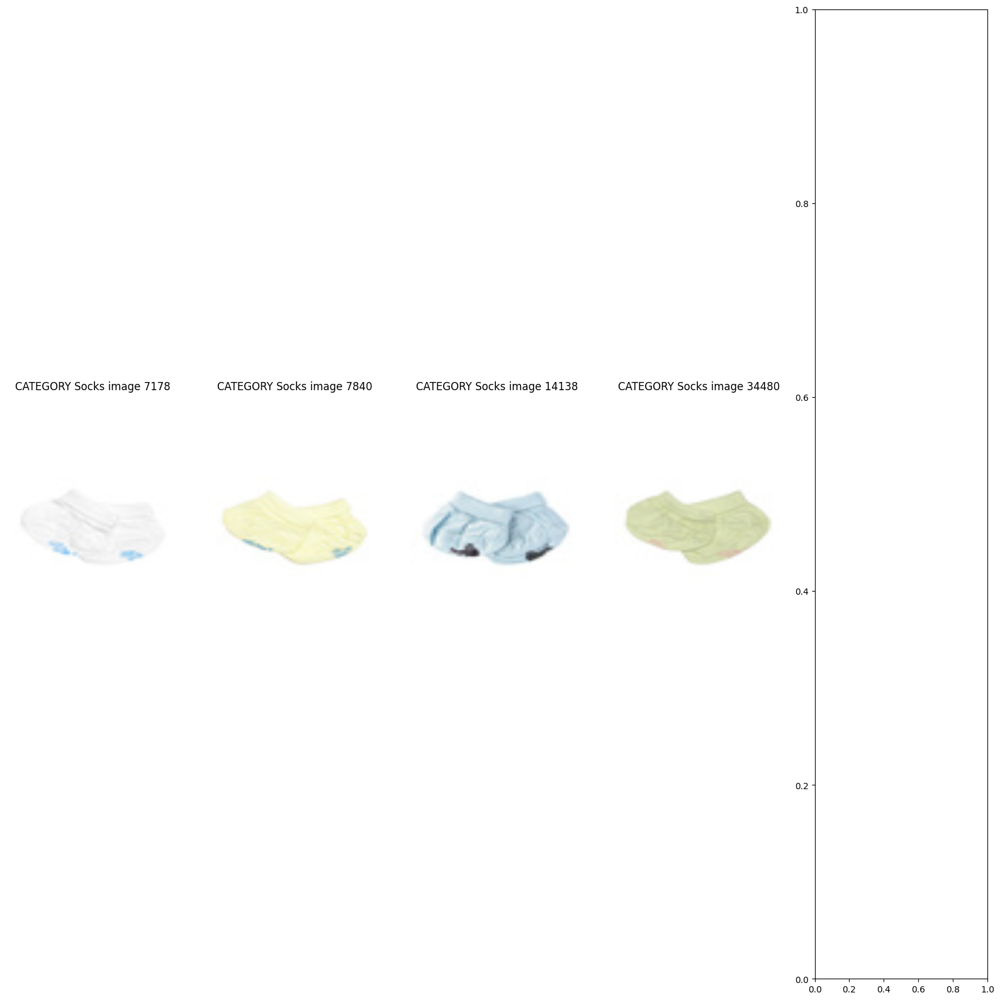

In [ ]:
# iterate through subcategories to see which are worth keeping
for C in df.subCategory.unique():
    figures = {f'CATEGORY {C} ' + f'image {i}' + '\n' : load_image(row['id']) for i, row in df[df.subCategory == C].sample(5, replace=1).iterrows()}
    plot_figures(figures, 1, 5)

In [45]:
# drop unneeded categories
drop_categories = ['Innerwear', 'Saree', 'Apparel Set', 'Socks']
df = df[~df.subCategory.isin(drop_categories)]
df.shape

(28264, 10)

In [46]:
# we will only keep articleTypes with a significant number of samples
large_classes = df.groupby('articleType').count()
large_classes = large_classes[large_classes.id > 100].index
large_classes

df = df[df.articleType.isin(large_classes)]
df.shape

(27706, 10)

C:\Users\patri\AppData\Local\Temp\ipykernel_27740\1266951316.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize)


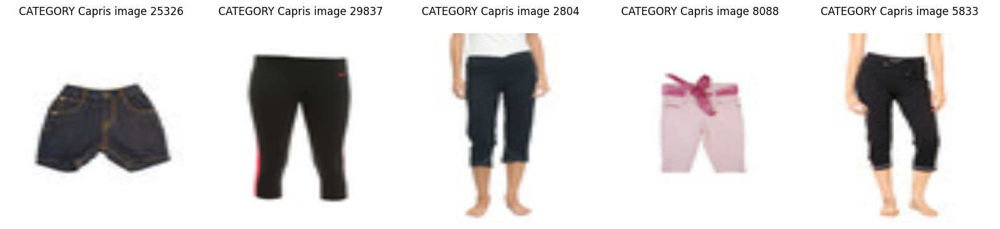

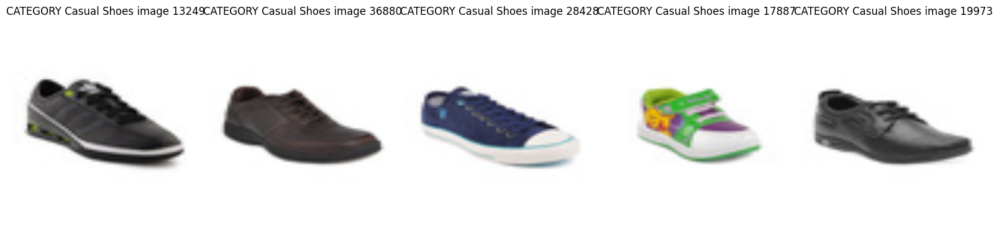

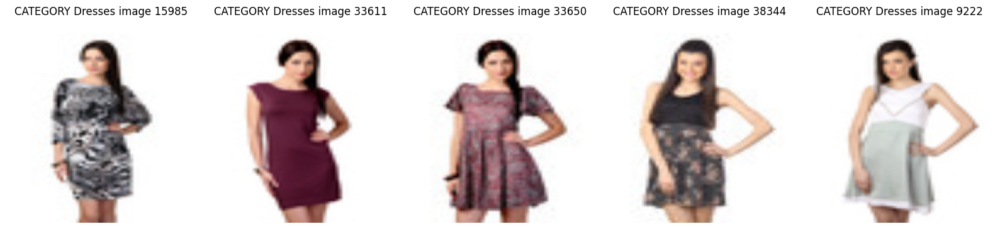

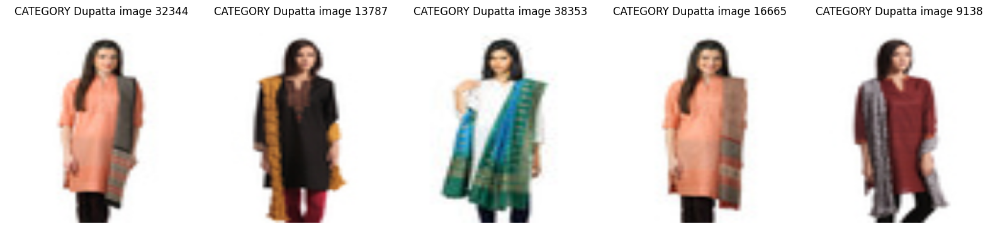

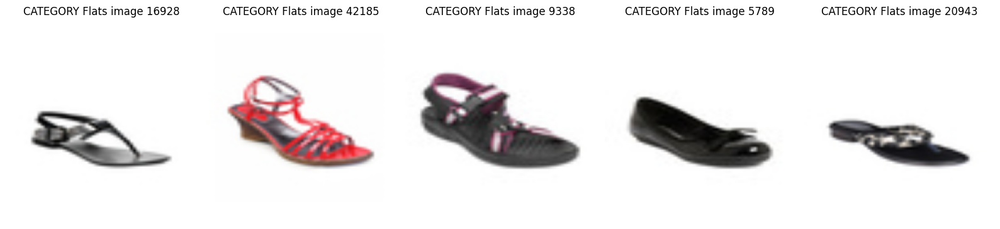

...

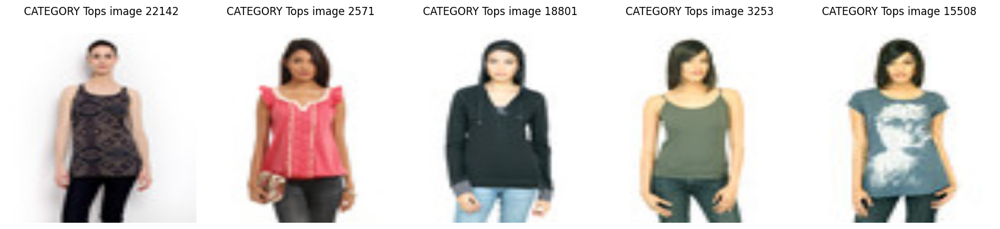

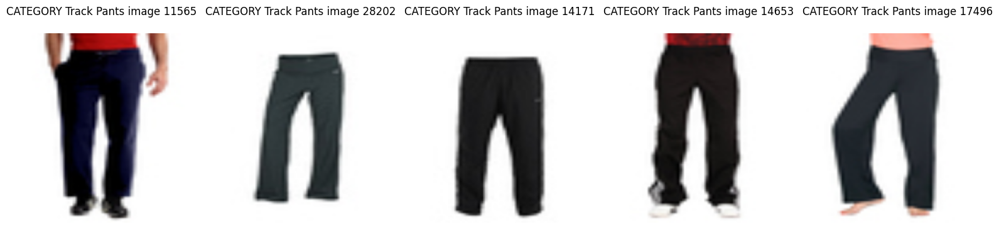

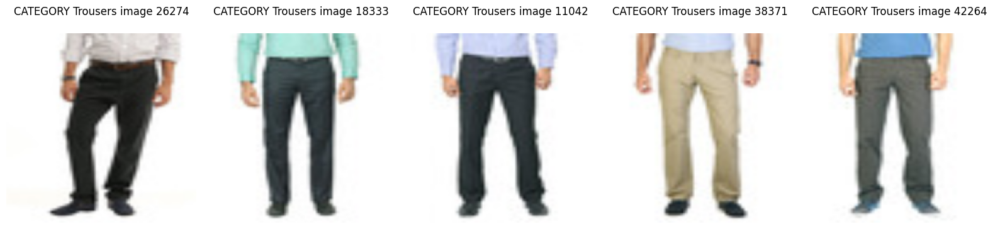

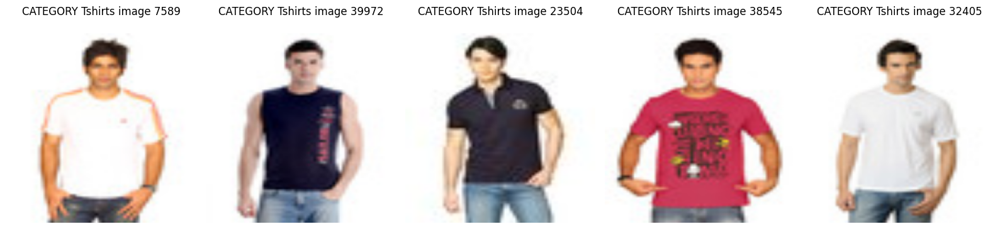

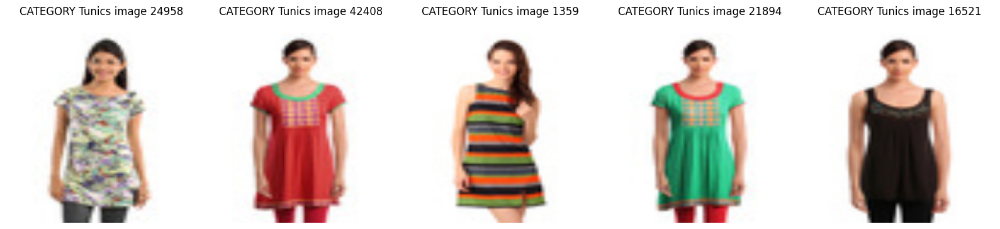

In [47]:
# check article types for more to remove
for C in large_classes:
    figures = {f'CATEGORY {C} ' + f'image {i}' + '\n' : load_image(row['id']) for i, row in df[df.articleType == C].sample(5, replace=1).iterrows()}
    plot_figures(figures, 1, 5)

In [48]:
# drop unneeded categories
drop_categories = ['Kurtas', 'Kurtis', 'Night suits', 'Nightdress', 'Dupatta']
df = df[~df.articleType.isin(drop_categories)]
df.shape

(25182, 10)

In [49]:
# confirming no empty values for article type
df.isnull().sum()

id                     0
gender                 0
masterCategory         0
subCategory            0
articleType            0
baseColour             6
season                21
year                   1
usage                  5
productDisplayName     0
dtype: int64

In [50]:
# send filtered data to csv
df.reset_index(drop=True, inplace=True)
df.to_csv('cleaned_styles.csv', index=False)